# General Overview:


- Gauging how customers feel about your products and services,especially on social media platforms (Twitter, Facebook, etc.) is very importamt 

- Sentiment analysis makes is easier extract customers’ sentiment from textual information especially since its not feasible to read thousands of comments 


- Sentiment analysis is a highly effective tool for a business and has the following advantages;

  - Taking a look at the overall brand perception
  
  - Evaluation of customer attitudes and emotions towards a specific product line or service.
  
  -  Helping the businesses to better understand the customers and detect subtle shifts in their opinions in order to meet changing demand.



# Dataset

- I will be using the [Yelp dataset](https://www.kaggle.com/yelp-dataset/yelp-dataset) for this task

- Yelp is a  platform which publishes crowd-sourced reviews about businesses, 

  - Yelp provides valuable features such as restaurant ratings, tips, and reviews that other useful information

  - This dataset contains 6 JSON files:

  - **business.json** — business data such as location, rating(stars), and attributes.

  - **review.json** — user reviews including user ids, business ids, etc.

  - **user.json** — user data such as number of reviews written, friends, and some metadata.

  - **checkin.json** — checkin data, including checkin id and business id.

  - **tip.json** — tips written by users, which are shorter reviews (At first I thought this is the “tips” that customers leave after the service. Another reminder for us to make sure to fully understand the data before analysis.

 - **photo.json** — photo data including captions and labels.

- [yelp dataset documentation](https://www.yelp.com/dataset/documentation/main)

##Loading Dataset from kaggle

[Getting dataset from kaggle](https://medium.com/analytics-vidhya/how-to-fetch-kaggle-datasets-into-google-colab-ea682569851a)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Colab Notebooks/Kaggle"

In [ ]:
                      #changing the working directory
%cd /content/gdrive/My Drive/Colab Notebooks/Kaggle

In [ ]:
!kaggle datasets download -d yelp-dataset/yelp-dataset

In [ ]:
!ls

In [ ]:
                  #unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

##Expository Data Analysis 

In [ ]:
import pandas as pd
import numpy as np
import json
import os
import re
import matplotlib.pyplot as plt
import seaborn as sns
# from  mpl_toolkits.basemap import Basemap
from nltk.corpus import stopwords
plt.style.use('fivethirtyeight')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
!apt-get install libgeos-3.5.0
!apt-get install libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/master.zip
!pip install pyproj==1.9.6

In [ ]:
from mpl_toolkits.basemap import Basemap

In [ ]:
                                          ##loadig .json file into Dataframe
business_info = []
with open('/content/drive/My Drive/Colab Notebooks/Kaggle/yelp_academic_dataset_business.json') as file_:
  for i,line in enumerate(file_):
    business_info.append(json.loads(line))  #since each line is a string,
                                            # then there is a need to use "json.loads"

                            #getting files into dataframe
business_data = pd.DataFrame(business_info)
business_data.head(3)                                            

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,f9NumwFMBDn751xgFiRbNA,The Range At Lake Norman,10913 Bailey Rd,Cornelius,NC,28031,35.462724,-80.852612,3.5,36,1,"{'BusinessAcceptsCreditCards': 'True', 'BikePa...","Active Life, Gun/Rifle Ranges, Guns & Ammo, Sh...","{'Monday': '10:0-18:0', 'Tuesday': '11:0-20:0'..."
1,Yzvjg0SayhoZgCljUJRF9Q,"Carlos Santo, NMD","8880 E Via Linda, Ste 107",Scottsdale,AZ,85258,33.569404,-111.890264,5.0,4,1,"{'GoodForKids': 'True', 'ByAppointmentOnly': '...","Health & Medical, Fitness & Instruction, Yoga,...",None
2,XNoUzKckATkOD1hP6vghZg,Felinus,3554 Rue Notre-Dame O,Montreal,QC,H4C 1P4,45.479984,-73.580070,5.0,5,1,None,"Pets, Pet Services, Pet Groomers",None


In [ ]:
                                                              #Dataset Information Table for each colum
print("Shape of Data: ", business_data.shape)                                                              
Data_Dict=pd.DataFrame(business_data.dtypes)                   #datatype of each column
Data_Dict['Missing Val'] = business_data.isnull().sum()        #num of missing values, add to table
Data_Dict['Num of Zeros'] = (business_data == 0).sum(0)
Data_Dict['% Num of Zeros'] = round((Data_Dict['Num of Zeros'].astype(int)/business_data.shape[0] * 100),2)
#Data_Dict['nUnique Values']= business_data.nunique()            #num of unique entries, add to table
Data_Dict = Data_Dict.reset_index()
Data_Dict=Data_Dict.rename(columns={0:'Datatype',
                                  'index':'Column names'})
print('The Table below shows the Data Information of each column ')
Data_Dict

Shape of Data:  (209393, 14)
The Table below shows the Data Information of each column 


,Column names,Datatype,Missing Val,Num of Zeros,% Num of Zeros
0,business_id,object,0,0,0.00
1,name,object,0,0,0.00
2,address,object,0,0,0.00
3,city,object,0,0,0.00
4,state,object,0,0,0.00
5,postal_code,object,0,0,0.00
6,latitude,float64,0,0,0.00
7,longitude,float64,0,0,0.00
8,stars,float64,0,0,0.00
9,review_count,int64,0,0,0.00


### Bar Chart -Top Businesses

In [ ]:
              ##getting datasets without missig catergories...
df = business_data[business_data.categories.notna()]
df.shape

(208869, 14)

In [ ]:
df.categories

0         Active Life, Gun/Rifle Ranges, Guns & Ammo, Sh...
1         Health & Medical, Fitness & Instruction, Yoga,...
2                          Pets, Pet Services, Pet Groomers
3         Hardware Stores, Home Services, Building Suppl...
4         Home Services, Plumbing, Electricians, Handyma...
                                ...                        
209388                    Japanese, Sushi Bars, Restaurants
209389    Department Stores, Food, Mobile Phones, Fashio...
209390    American (New), Food, Burgers, Restaurants, Fa...
209391                     Pet Services, Pet Training, Pets
209392    Tax Services, Professional Services, Accountan...
Name: categories, Length: 208869, dtype: object

In [ ]:
                  ##joining all the catergories row_values by a semicolon ';'
join_cat = ';'.join(df.categories)  
join_cat

"Active Life, Gun/Rifle Ranges, Guns & Ammo, Shopping;Health & Medical, Fitness & Instruction, Yoga, Active Life, Pilates;Pets, Pet Services, Pet Groomers;Hardware Stores, Home Services, Building Supplies, Home & Garden, Shopping;Home Services, Plumbing, Electricians, Handyman, Contractors;Auto Repair, Automotive, Oil Change Stations, Transmission Repair;Dry Cleaning & Laundry, Local Services, Laundry Services;Auto Repair, Oil Change Stations, Automotive, Tires;Ethnic Food, Food Trucks, Specialty Food, Imported Food, Argentine, Food, Restaurants, Empanadas;Martial Arts, Gyms, Fitness & Instruction, Active Life;Contractors, Landscaping, Home Services;Automotive, Auto Repair;Desserts, Food, Ice Cream & Frozen Yogurt;Contractors, Home Services, Local Services;Beauty & Spas, Tanning;Local Services, Self Storage;Shopping, Shoe Stores, Fashion;Event Planning & Services, Wedding Planning, Flowers & Gifts, Shopping, Party & Event Planning, Florists;Auto Customization, Tires, Motorcycle Repair,

In [ ]:
                            #splitting the word bunch above to individual work 
split_cat = re.split(';|,', join_cat)
split_cat[:25]

['Active Life',
 ' Gun/Rifle Ranges',
 ' Guns & Ammo',
 ' Shopping',
 'Health & Medical',
 ' Fitness & Instruction',
 ' Yoga',
 ' Active Life',
 ' Pilates',
 'Pets',
 ' Pet Services',
 ' Pet Groomers',
 'Hardware Stores',
 ' Home Services',
 ' Building Supplies',
 ' Home & Garden',
 ' Shopping',
 'Home Services',
 ' Plumbing',
 ' Electricians',
 ' Handyman',
 ' Contractors',
 'Auto Repair',
 ' Automotive',
 ' Oil Change Stations']

In [ ]:
                            #trimming the characters above .....
                            #..removing unwanted spaces where necessary
trim_cat = [i.lstrip() for i in split_cat]
trim_cat[:25]

['Active Life',
 'Gun/Rifle Ranges',
 'Guns & Ammo',
 'Shopping',
 'Health & Medical',
 'Fitness & Instruction',
 'Yoga',
 'Active Life',
 'Pilates',
 'Pets',
 'Pet Services',
 'Pet Groomers',
 'Hardware Stores',
 'Home Services',
 'Building Supplies',
 'Home & Garden',
 'Shopping',
 'Home Services',
 'Plumbing',
 'Electricians',
 'Handyman',
 'Contractors',
 'Auto Repair',
 'Automotive',
 'Oil Change Stations']

In [ ]:
                  #getting the values above into dataframe
business_cat_df = pd.DataFrame(trim_cat,columns=["Business_Category"])
business_cat_df.head()

,Business_Category
0,Active Life
1,Gun/Rifle Ranges
2,Guns & Ammo
3,Shopping
4,Health & Medical


In [ ]:
              #
catergory_counts = business_cat_df.Business_Category.value_counts().sort_values(ascending=False)[:20]
catergory_counts

Restaurants                  63944
Shopping                     34644
Food                         32991
Home Services                22487
Beauty & Spas                20520
Health & Medical             19227
Local Services               15783
Automotive                   14720
Nightlife                    14211
Bars                         12400
Event Planning & Services    11263
Active Life                  10225
Coffee & Tea                  8415
Fashion                       8374
Fast Food                     8106
Sandwiches                    8064
American (Traditional)        7596
Home & Garden                 7331
Hair Salons                   7303
Pizza                         7302
Name: Business_Category, dtype: int64

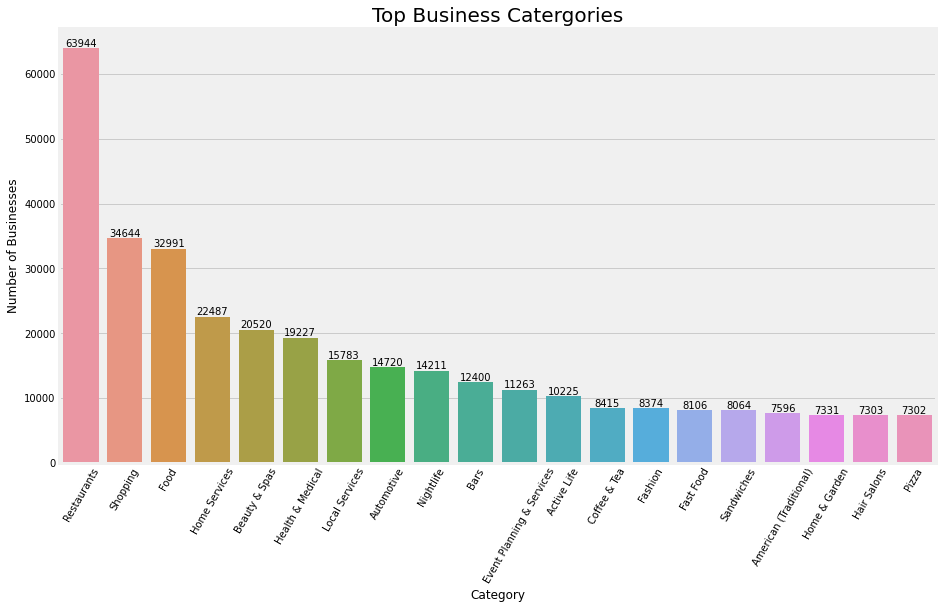

In [ ]:
plt.figure(figsize=(14,8))
ax =sns.barplot(catergory_counts.index,catergory_counts.values)
x_locs,x_lables = plt.xticks()
plt.setp(x_lables, rotation=60)     ##rotating the x_lables
plt.title("Top Business Catergories", fontsize=20)
plt.ylabel("Number of Businesses", fontsize=12)
plt.xlabel("Category",fontsize=12)

                  #adding text lables...
r = ax.patches
labels = catergory_counts.values
for rec,label in zip(r,labels):
  height = rec.get_height()
  ax.text(rec.get_x() + rec.get_width()/2,
          height+10,
          label,
          ha='center',
          va='bottom')

### Geographical Location

In [ ]:
                    ##getting data subset that have "Restaurants" in their "catergory" column
resturants_df  = df.loc[[i for i in df['categories'].index
                        if re.search("Restaurants",df['categories'][i])]]
resturants_df.head(3)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
8,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,404 E Green St,Champaign,IL,61820,40.110446,-88.233073,4.5,5,1,"{'RestaurantsAttire': 'u'casual'', 'Restaurant...","Ethnic Food, Food Trucks, Specialty Food, Impo...","{'Monday': '11:30-14:30', 'Tuesday': '11:30-14..."
20,CsLQLiRoafpJPJSkNX2h5Q,Middle East Deli,4508 E Independence Blvd,Charlotte,NC,28205,35.194894,-80.767442,3.0,5,0,"{'RestaurantsGoodForGroups': 'True', 'OutdoorS...","Food, Restaurants, Grocery, Middle Eastern",None
24,eBEfgOPG7pvFhb2wcG9I7w,Philthy Phillys,"15480 Bayview Avenue, unit D0110",Aurora,ON,L4G 7J1,44.010962,-79.448677,4.5,4,1,"{'RestaurantsTableService': 'False', 'Restaura...","Restaurants, Cheesesteaks, Poutineries","{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'..."


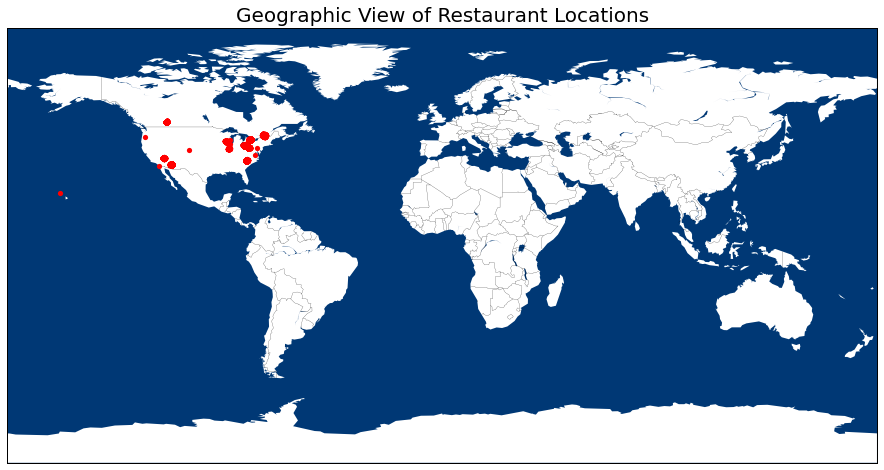

In [ ]:
            #geographical location of the resturants.....
plt.figure(figsize=(14,8))
plt.title("Geographic View of Restaurant Locations",fontsize=20)

m = Basemap(projection='cyl',
            lon_0 = 0,
            lat_0 = 0,
            resolution = 'c')

m.fillcontinents(color= 'white',
                 lake_color ='#003875')

m.drawmapboundary(fill_color='#003875')

m.drawcountries(linewidth=0.2,
                color='black')

m_coords = m(resturants_df['longitude'].tolist(),
             resturants_df['latitude'].tolist())

m.scatter(m_coords[0],m_coords[1],s=5,c='red',lw=3,zorder=5);

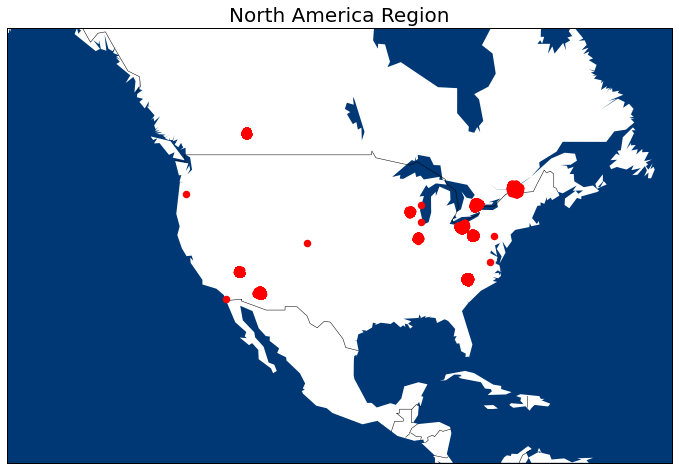

In [ ]:
                                #taking a closer look into North America
long_min, long_max = -150,-50   #coordinates of North America
lat_min,lat_max = 10,60

plt.figure(figsize=(14,8))
map_NA = Basemap(projection='merc',
                 llcrnrlat=lat_min,
                 urcrnrlat=lat_max,
                 llcrnrlon = long_min,
                 urcrnrlon = long_max,
                 resolution='c')

plt.title("North America Region", fontsize = 20)

map_NA.fillcontinents(color= 'white',
                 lake_color ='#003875')

map_NA.drawmapboundary(fill_color='#003875')

map_NA.drawcountries(linewidth=0.5,
                color='black')

map_NA_coords = map_NA(resturants_df['longitude'].tolist(),
             resturants_df['latitude'].tolist())

map_NA.scatter(map_NA_coords[0],map_NA_coords[1],s=20,c='red',lw=3,zorder=5);

In [ ]:
                    ##getting top  cities with the highest number of restaurants....
                    ##joining the separte "city" and "state" columns into "City_State"
resturants_df['City_State'] = resturants_df['city'] + ',' + resturants_df['state'] 
city_state_counts = resturants_df['City_State'].value_counts().sort_values(ascending= False)[:20]
city_state_counts

Toronto,ON          8678
Las Vegas,NV        6930
Phoenix,AZ          4216
Montréal,QC         4097
Calgary,AB          3115
Charlotte,NC        2920
Pittsburgh,PA       2608
Scottsdale,AZ       1652
Mississauga,ON      1612
Cleveland,OH        1549
Mesa,AZ             1238
Madison,WI          1175
Tempe,AZ            1094
Henderson,NV         950
Markham,ON           925
Chandler,AZ          920
Glendale,AZ          771
Gilbert,AZ           616
Brampton,ON          603
Richmond Hill,ON     562
Name: City_State, dtype: int64

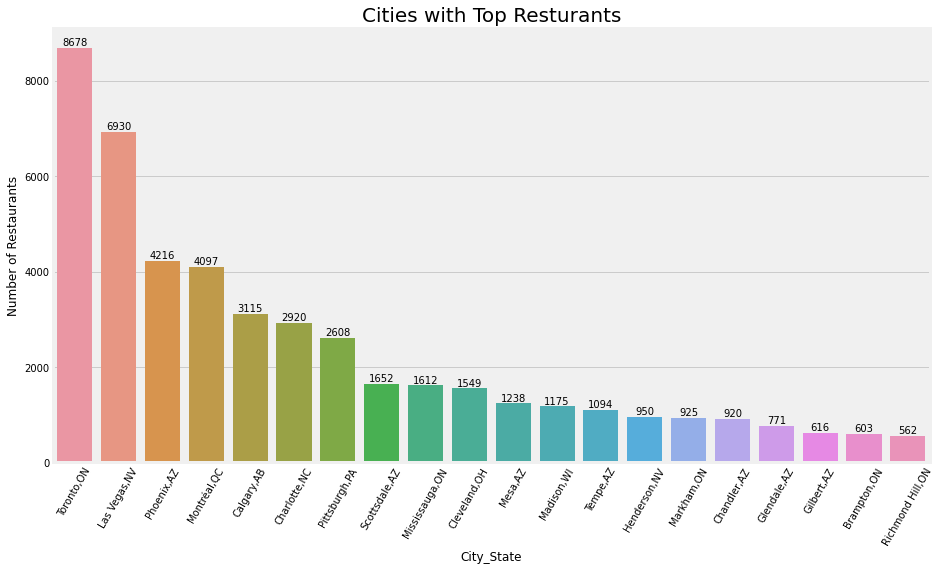

In [ ]:
plt.figure(figsize=(14,8))
ax =sns.barplot(city_state_counts.index,city_state_counts.values)
x_locs,x_lables = plt.xticks()
plt.setp(x_lables, rotation=60)     ##rotating the x_lables
plt.title("Cities with Top Resturants", fontsize=20)
plt.ylabel("Number of Restaurants", fontsize=12)
plt.xlabel("City_State",fontsize=12)

                  #adding text lables...
r = ax.patches
labels = city_state_counts.values
for rec,label in zip(r,labels):
  height = rec.get_height()
  ax.text(rec.get_x() + rec.get_width()/2,
          height+10,
          label,
          ha='center',
          va='bottom')

In [ ]:
                    #getting the most popular restaurants
resturants_counts = resturants_df['name'].value_counts().sort_values(ascending= False)[:20]
resturants_counts

McDonald's                   854
Subway Restaurants           613
Burger King                  337
Taco Bell                    334
Pizza Hut                    330
Wendy's                      323
Subway                       243
Domino's Pizza               232
Tim Hortons                  226
KFC                          214
Starbucks                    208
Chipotle Mexican Grill       191
Jack in the Box              184
Jimmy John's                 165
Panera Bread                 165
Popeyes Louisiana Kitchen    159
Panda Express                157
Papa John's Pizza            155
Arby's                       147
Little Caesars Pizza         122
Name: name, dtype: int64

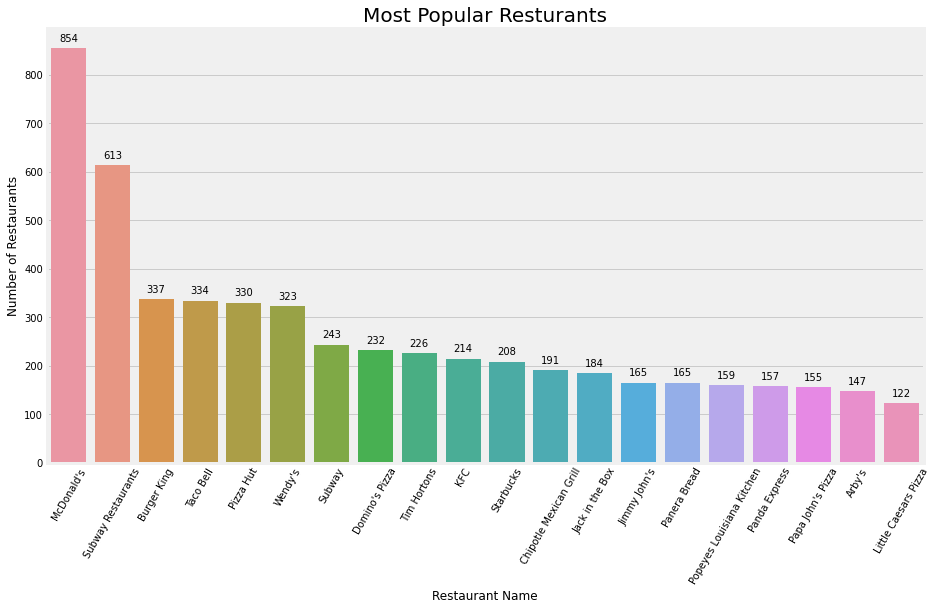

In [ ]:
plt.figure(figsize=(14,8))
ax =sns.barplot(resturants_counts.index,resturants_counts.values)
x_locs,x_lables = plt.xticks()
plt.setp(x_lables, rotation=60)     ##rotating the x_lables
plt.title("Most Popular Resturants", fontsize=20)
plt.ylabel("Number of Restaurants", fontsize=12)
plt.xlabel("Restaurant Name",fontsize=12)

                  #adding text lables...
r = ax.patches
labels = resturants_counts.values
for rec,label in zip(r,labels):
  height = rec.get_height()
  ax.text(rec.get_x() + rec.get_width()/2,
          height+10,
          label,
          ha='center',
          va='bottom')

### BoxPlot Rating Comparison

In [ ]:
              #getting data subset..
                                #get separate data for resturants to compare...
MacDn_vs_BurgK = resturants_df.loc[(resturants_df['name']=="McDonald's") |
                                   (resturants_df['name']=="Burger King") ]

PizzH_vs_Domino = resturants_df.loc[(resturants_df['name']=="Pizza Hut") |
                                   (resturants_df['name']=="Domino's Pizza")]

SubRes_vs_JimmyJ = resturants_df.loc[(resturants_df['name']=="Subway Restaurants") |
                                   (resturants_df['name']=="Jimmy John's")]

Text(0.5, 0, 'Restaurant Name ')

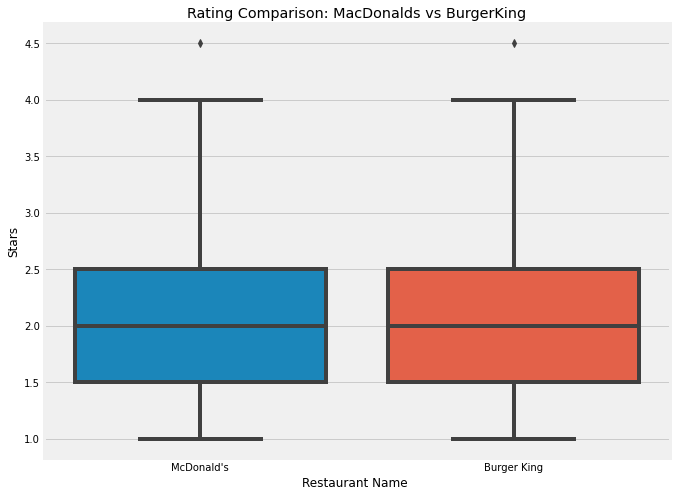

In [ ]:
plt.figure(figsize=(10,8))
sns.boxplot(x= 'name',y='stars',data=MacDn_vs_BurgK)
plt.title("Rating Comparison: MacDonalds vs BurgerKing")
plt.ylabel("Stars",fontsize=12)
plt.xlabel("Restaurant Name ",fontsize=12)

Text(0.5, 0, 'Restaurant Name ')

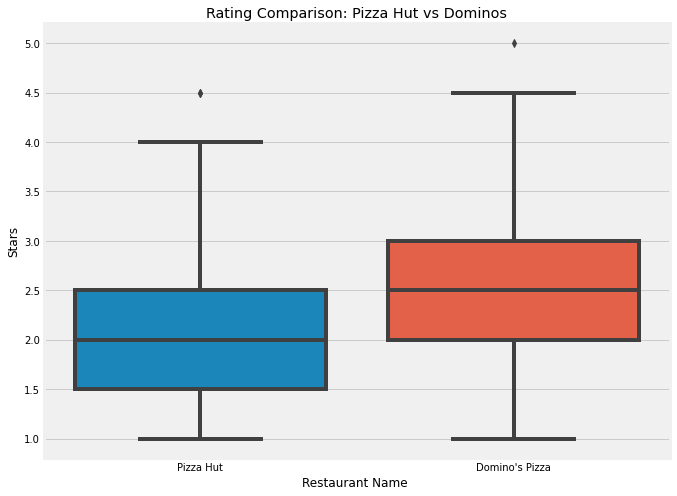

In [ ]:
plt.figure(figsize=(10,8))
sns.boxplot(x= 'name',y='stars',data=PizzH_vs_Domino)
plt.title("Rating Comparison: Pizza Hut vs Dominos")
plt.ylabel("Stars",fontsize=12)
plt.xlabel("Restaurant Name ",fontsize=12)

Text(0.5, 0, 'Restaurant Name ')

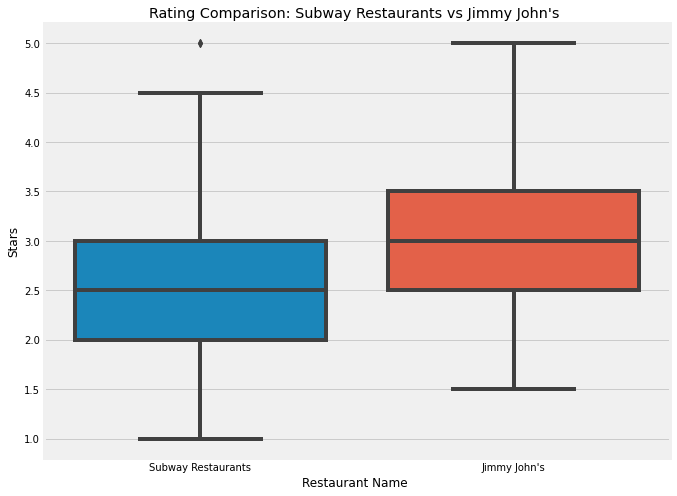

In [ ]:
plt.figure(figsize=(10,8))
sns.boxplot(x= 'name',y='stars',data=SubRes_vs_JimmyJ)
plt.title("Rating Comparison: Subway Restaurants vs Jimmy John's ")
plt.ylabel("Stars",fontsize=12)
plt.xlabel("Restaurant Name ",fontsize=12)

Text(0.5, 0, 'Rating')

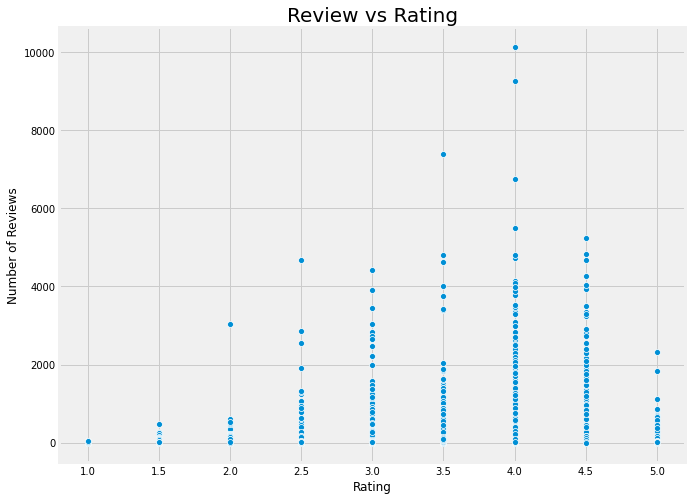

In [ ]:
                  ##Correlation between reviews and rating ..
plt.figure(figsize=(10,8))
sns.scatterplot(x='stars',y='review_count',data= resturants_df)
plt.title("Review vs Rating", fontsize= 20)
plt.ylabel("Number of Reviews", fontsize=12)
plt.xlabel("Rating", fontsize=12)

In [ ]:
          #checking the resturants attributes..
          #its a dictionary as shown below 
resturants_df['attributes']

8         {'RestaurantsAttire': 'u'casual'', 'Restaurant...
20        {'RestaurantsGoodForGroups': 'True', 'OutdoorS...
24        {'RestaurantsTableService': 'False', 'Restaura...
25        {'GoodForKids': 'True', 'RestaurantsTakeOut': ...
30        {'Ambience': '{'touristy': False, 'hipster': F...
                                ...                        
209381    {'NoiseLevel': 'u'average'', 'BikeParking': 'T...
209383    {'NoiseLevel': 'u'average'', 'BikeParking': 'F...
209385    {'BusinessAcceptsCreditCards': 'True', 'Restau...
209388    {'Ambience': '{'romantic': False, 'intimate': ...
209390    {'BusinessAcceptsCreditCards': 'True', 'Restau...
Name: attributes, Length: 63944, dtype: object

In [ ]:
resturants_df['attributes'] = resturants_df['attributes'].apply(lambda x: {}
                                                        if x is None else x)
resturants_df['attributes']

8         {'RestaurantsAttire': 'u'casual'', 'Restaurant...
20        {'RestaurantsGoodForGroups': 'True', 'OutdoorS...
24        {'RestaurantsTableService': 'False', 'Restaura...
25        {'GoodForKids': 'True', 'RestaurantsTakeOut': ...
30        {'Ambience': '{'touristy': False, 'hipster': F...
                                ...                        
209381    {'NoiseLevel': 'u'average'', 'BikeParking': 'T...
209383    {'NoiseLevel': 'u'average'', 'BikeParking': 'F...
209385    {'BusinessAcceptsCreditCards': 'True', 'Restau...
209388    {'Ambience': '{'romantic': False, 'intimate': ...
209390    {'BusinessAcceptsCreditCards': 'True', 'Restau...
Name: attributes, Length: 63944, dtype: object

In [ ]:
                #separating the distionary into separate columsn withits values as column valus
attribute_df = pd.json_normalize(resturants_df['attributes'])
attribute_df.head(3)

,RestaurantsAttire,RestaurantsTakeOut,BusinessAcceptsCreditCards,NoiseLevel,GoodForKids,RestaurantsReservations,RestaurantsGoodForGroups,BusinessParking,RestaurantsPriceRange2,HasTV,Alcohol,BikeParking,RestaurantsDelivery,ByAppointmentOnly,OutdoorSeating,RestaurantsTableService,DogsAllowed,WiFi,Caters,Ambience,GoodForMeal,HappyHour,WheelchairAccessible,BYOB,Corkage,DietaryRestrictions,DriveThru,BusinessAcceptsBitcoin,Music,BestNights,GoodForDancing,Smoking,BYOBCorkage,CoatCheck,AgesAllowed,RestaurantsCounterService,Open24Hours,AcceptsInsurance,HairSpecializesIn
0,u'casual',True,True,u'quiet',False,False,False,None,1,True,'none',False,True,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,u'casual',True,True,NaN,True,False,True,"{'garage': False, 'street': False, 'validated'...",1,NaN,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,True,NaN,NaN,NaN,False,NaN,"{'garage': False, 'street': False, 'validated'...",NaN,True,u'none',True,True,NaN,False,False,False,u'no',True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
          #checking the attributes of the restaurants..
attribute_df.columns

Index(['RestaurantsAttire', 'RestaurantsTakeOut', 'BusinessAcceptsCreditCards',
       'NoiseLevel', 'GoodForKids', 'RestaurantsReservations',
       'RestaurantsGoodForGroups', 'BusinessParking', 'RestaurantsPriceRange2',
       'HasTV', 'Alcohol', 'BikeParking', 'RestaurantsDelivery',
       'ByAppointmentOnly', 'OutdoorSeating', 'RestaurantsTableService',
       'DogsAllowed', 'WiFi', 'Caters', 'Ambience', 'GoodForMeal', 'HappyHour',
       'WheelchairAccessible', 'BYOB', 'Corkage', 'DietaryRestrictions',
       'DriveThru', 'BusinessAcceptsBitcoin', 'Music', 'BestNights',
       'GoodForDancing', 'Smoking', 'BYOBCorkage', 'CoatCheck', 'AgesAllowed',
       'RestaurantsCounterService', 'Open24Hours', 'AcceptsInsurance',
       'HairSpecializesIn'],
      dtype='object')

In [ ]:
                #checking out those restaurants that "open24hours"
attribute_df['Open24Hours'].value_counts()

False    7
True     2
Name: Open24Hours, dtype: int64

In [ ]:
                #checking out those restaurants that "acceptBitcoin"
attribute_df['BusinessAcceptsBitcoin'].value_counts()

False    4245
True       74
Name: BusinessAcceptsBitcoin, dtype: int64

In [ ]:
              #creating a cross tab to compare "Restaurants' rating" and "Rating stars"
pd.crosstab(resturants_df['stars'],
            attribute_df['RestaurantsDelivery'],
            margins=True,
            normalize='index')

RestaurantsDelivery,False,None,True
stars,,,
1.0,0.581967,0.049180,0.368852
1.5,0.593434,0.017677,0.388889
2.0,0.641283,0.010020,0.348697
2.5,0.596458,0.018343,0.385199
3.0,0.623143,0.014162,0.362694
3.5,0.625852,0.017567,0.356581
4.0,0.605974,0.020260,0.373766
4.5,0.627789,0.014706,0.357505
5.0,0.608802,0.002445,0.388753


In [ ]:
          #viewings restautrant that met certain catergories
df_tor = resturants_df.loc[resturants_df['city'] == 'Toronto']
crit = (df_tor['stars'] > 3.5) & (df_tor['review_count'] > 100) & (df_tor['is_open'] == 1) & (attribute_df.RestaurantsTakeOut == 'True') & (attribute_df.RestaurantsPriceRange2 == '2') & (attribute_df.BusinessAcceptsCreditCards == 'True')
in_toronto_df = df_tor.loc[crit]
in_toronto_df.head(3)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,City_State
73,0QjROMVW9ACKjhSEfHqNCQ,Mi Mi Restaurant,688 Gerrard Street E,Toronto,ON,M4M 1Y3,43.666376,-79.348773,4.0,116,1,"{'RestaurantsTakeOut': 'True', 'Alcohol': 'u'b...","Vietnamese, Restaurants","{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...","Toronto,ON"
1507,IfUkm42SB9D0m_ZbkQ711A,The Fish Store & Sandwiches,657 College Street,Toronto,ON,M6G 1B7,43.654921,-79.416314,4.0,138,1,"{'OutdoorSeating': 'True', 'RestaurantsDeliver...","Restaurants, Seafood, Sandwiches","{'Monday': '10:30-20:0', 'Tuesday': '10:30-20:...","Toronto,ON"
2827,aRqxT28Tdz2aDiZ7Vkyejw,White Brick Kitchen,641 Bloor Street W,Toronto,ON,M6G 1L1,43.664176,-79.414961,4.0,246,1,"{'RestaurantsPriceRange2': '2', 'RestaurantsAt...","Comfort Food, Restaurants, Breakfast & Brunch","{'Tuesday': '9:0-17:0', 'Wednesday': '9:0-17:0...","Toronto,ON"


In [ ]:

top_toronto_df = in_toronto_df.sort_values(by=['stars','review_count'],ascending=False)[:20]
top_toronto_df.name

28918                         Ramen Isshin
46423                Fresco's Fish & Chips
49260                              BarChef
37688       Descendant Detroit Style Pizza
4472                            Hodo Kwaja
49245                         Saigon Lotus
27989                              deKEFIR
60497                         Banh Mi Boys
30969              Manpuku Japanese Eatery
16129                          Le Gourmand
2827                   White Brick Kitchen
30799                           La Palette
43941              Aoyama Sushi Restaurant
4794                         Mangia & Bevi
4136                             La Cubana
56894                            Snow Time
27647                       Town Crier Pub
13850                                Mezes
32937    Tofu Village - House of Soon Tofu
35305                                 Kiin
Name: name, dtype: object

Text(0.5, 0, 'Restaurant Name')

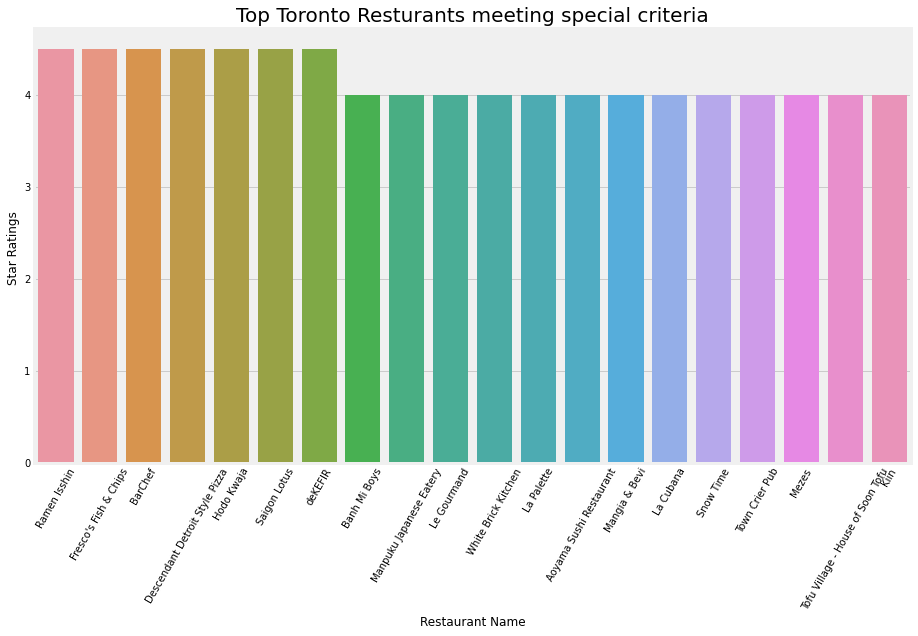

In [ ]:
plt.figure(figsize=(14,8))
ax =sns.barplot(x='name', y = 'stars',data= top_toronto_df)
x_locs,x_lables = plt.xticks()
plt.setp(x_lables, rotation=60)     ##rotating the x_lables
plt.title("Top Toronto Resturants meeting special criteria", fontsize=20)
plt.ylabel("Star Ratings ", fontsize=12)
plt.xlabel("Restaurant Name",fontsize=12)
                  #adding text lables...
# r = ax.patches
# labels = resturants_counts.values
# for rec,label in zip(r,labels):
#   height = rec.get_height()
#   ax.text(rec.get_x() + rec.get_width()/2,
#           height+10,
#           label,
#           ha='center',
#           va='bottom')

### Word Cloud for Tips

In [ ]:
from wordcloud import WordCloud
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')   #downloading stopwords....

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
                                          ##loadig .json file into Dataframe
tips_info = []
with open('/content/drive/My Drive/Colab Notebooks/Kaggle/yelp_academic_dataset_tip.json') as file_:
  for i,line in enumerate(file_):
    tips_info.append(json.loads(line))       #since each line is a string,
                                            # then there is a need to use "json.loads"

df_tips = pd.DataFrame(tips_info)
df_tips.head()

,user_id,business_id,text,date,compliment_count
0,hf27xTME3EiCp6NL6VtWZQ,UYX5zL_Xj9WEc_Wp-FrqHw,Here for a quick mtg,2013-11-26 18:20:08,0
1,uEvusDwoSymbJJ0auR3muQ,Ch3HkwQYv1YKw_FO06vBWA,Cucumber strawberry refresher,2014-06-15 22:26:45,0
2,AY-laIws3S7YXNl_f_D6rQ,rDoT-MgxGRiYqCmi0bG10g,Very nice good service good food,2016-07-18 22:03:42,0
3,Ue_7yUlkEbX4AhnYdUfL7g,OHXnDV01gLokiX1ELaQufA,It's a small place. The staff is friendly.,2014-06-06 01:10:34,0
4,LltbT_fUMqZ-ZJP-vJ84IQ,GMrwDXRlAZU2zj5nH6l4vQ,"8 sandwiches, $24 total...what a bargain!!! An...",2011-04-08 18:12:01,0


In [ ]:
            #get the data of the "Ramen Isshin restaurant"- the restaurant toping  the list
Ramen_Isshin_resturants =  resturants_df.loc[(resturants_df['name'] == 'Ramen Isshin') & crit]
Ramen_Isshin_resturants_tips = df_tips.loc[df_tips['business_id'].isin(Ramen_Isshin_resturants['business_id'])]

In [ ]:
                    #observing the tips peopel give to this restaurants....
Ramen_Isshin_resturants_tips['text'].values[:20]

array(["Very small place fits about 30 people. They don't quite have a big sign.",
       'Liquor license coming soon.',
       "Try the soft tofu appetizer! It's quite light but I find it really tasty!",
       'They have a really cool chart in the front of their menu that breaks down each dish!',
       'For the gluten intolerant rice noodles are an option!!',
       'Order the white sesame ramen! Quite tasty!',
       'By far, the most spacious ramenya in Toronto.',
       'If you want to "kaedama" (get an extra portion of noodles) it\'s $1.50.  Totally worth it if you\'re a big eater or extra hungry!  :)',
       'Their spicy sauce is really good i got something similar when i was in Japan',
       "Mouth wash is the washrooms!  Now we can make our breath fresh again after eating! Isn't it a good idea?",
       '+$3.5 and get a rice bowl with your ramen!! Yummy and worth it!',
       "Hands down the best ramen I've ever had! The broth is super rich!!!",
       'Wow. Seriously good 

In [ ]:
          ##defining an helper function to process the  text above
def process_text(text):
  text= re.sub('[^a-z\s]','',text.lower())              ##getting out non_letters and putting them to lower case
  text = [w for w in text.split() if w not in stopwords.words('english')]  #removing stopwords 
  preprocessed_text = ''.join(text)
  return preprocessed_text

In [ ]:
pd.set_option('mode.chained_assignment',None)
Ramen_Isshin_resturants_tips['process_text'] = Ramen_Isshin_resturants_tips['text'].apply(process_text)

In [ ]:
              ##creating a word cloud or the tips texts...
word_cloud = WordCloud(width=1600,
                       height= 800,
                       random_state= 42,
                       max_words=1000000)

word_cloud.generate(str(Ramen_Isshin_resturants_tips['process_text']))

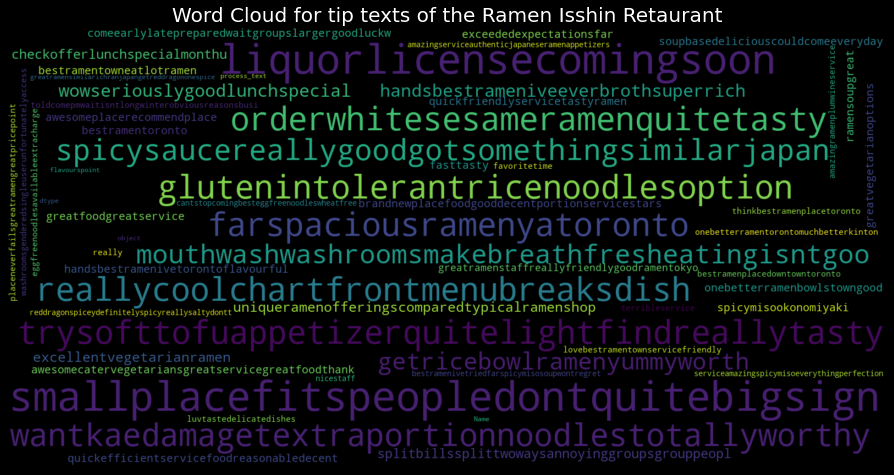

In [ ]:
plt.figure(figsize=(15,10),facecolor='black')
plt.title("Word Cloud for tip texts of the Ramen Isshin Retaurant", fontsize=20,color='white')
plt.imshow(word_cloud,interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)

### References: 

- [yelp Dataset EDA](https://towardsdatascience.com/discover-your-next-favorite-restaurant-exploration-and-visualization-on-yelps-dataset-157d9799123c)

-  [yelp Dataset EDA github](https://github.com/terryz1/Yelp_EDA/blob/master/code/yelp_eda.ipynb)

[text-analysis-in-python](https://towardsdatascience.com/getting-started-with-text-analysis-in-python-ca13590eb4f7)

[text-analysis-in-python-github](https://github.com/lisanka93/intro_ML_textdata/blob/master/BBC%20dataset%20and%20COVID-19%20vaccine%20concerns%20text%20classification.ipynb)